# Super resolution of drone images - First approach

In [ ]:
import urllib.request
import requests
import shutil
import random
import cv2
import os

# Links to images
url = "https://datasets.epfl.ch/dsr/links.txt"

# Open and read the txt
response = urllib.request.urlopen(url)
raw = response.read().decode('utf8')

# Split text to get the links
splitted = raw.split()

# Check the first link
print(splitted[0])

https://datasets.epfl.ch/dsr//0029/100/00/bicubic.png


In [ ]:
# Create the DSR_100m directory if they don't already exist
if not os.path.exists("DSR_100m"):
    os.makedirs("DSR_100m")

# Function to download an image from a link
def download_image(url, name):
    # Get the image name from the url
    image_name = url.split('/')[-1]
    # Open the url image, set stream to True, this will return the stream content.
    resp = requests.get(url, stream=True)
    # Open a local file with wb ( write binary ) permission.
    local_file = open("DSR_100m/"+name, 'wb')
    # Set decode_content value to True, otherwise the downloaded image file's size will be zero.
    resp.raw.decode_content = True
    # Copy the response stream raw data to local image file.
    shutil.copyfileobj(resp.raw, local_file)
    # Remove the image url response object.
    del resp

In [ ]:
count = 0

for link in splitted:
    if "tele.png" in link and "/100/" in link:
        download_image(link, name=str(count)+".png")
        count+=1
        if count > 200:
          break

In [ ]:
# Set the directories
download_dir = "DSR_100m"
train_dir = "train_100_400"
train_dir_lr = "train_100_400/lr_100"
train_dir_hr = "train_100_400/hr_400"
val_dir = "val_100_400"
val_dir_lr = "val_100_400/lr_100"
val_dir_hr = "val_100_400/hr_400"
test_dir = "test_100_400"
test_dir_lr = "test_100_400/lr_100"
test_dir_hr = "test_100_400/hr_400"


# Set the image size
low_res_size = (100, 100)
high_res_size = (400, 400)

# Create the directories if they don't already exist
if not os.path.exists(train_dir_lr):
    os.makedirs(train_dir_lr)
if not os.path.exists(train_dir_hr):
    os.makedirs(train_dir_hr)
if not os.path.exists(val_dir_lr):
    os.makedirs(val_dir_lr)
if not os.path.exists(val_dir_hr):
    os.makedirs(val_dir_hr)
if not os.path.exists(test_dir_lr):
    os.makedirs(test_dir_lr)
if not os.path.exists(test_dir_hr):
    os.makedirs(test_dir_hr)
    

# Get a list of all the images in the download directory
images = os.listdir(download_dir)

# Shuffle the images
random.shuffle(images)

# Calculate the number of images for each split
train_split = int(0.6 * len(images))
val_split = int(0.2 * len(images))
test_split = len(images) - train_split - val_split


# Split the images into the three sets
train_images = images[:train_split]
val_images = images[train_split:train_split+val_split]
test_images = images[train_split+val_split:]


# Process the images and save them to the appropriate directories
for image in train_images:
    # Load the image and resize it
    img = cv2.imread(os.path.join(download_dir, image))
    low_res = cv2.resize(img, low_res_size)
    high_res = cv2.resize(img, high_res_size)
    
    # Save the images
    cv2.imwrite(os.path.join(train_dir, "lr_100", image), low_res)
    cv2.imwrite(os.path.join(train_dir, "hr_400", image), high_res)

for image in val_images:
    # Load the image and resize it
    img = cv2.imread(os.path.join(download_dir, image))
    low_res = cv2.resize(img, low_res_size)
    high_res = cv2.resize(img, high_res_size)
    
    # Save the images
    cv2.imwrite(os.path.join(val_dir, "lr_100", image), low_res)
    cv2.imwrite(os.path.join(val_dir, "hr_400", image), high_res)
    
for image in test_images:
    # Load the image and resize it
    img = cv2.imread(os.path.join(download_dir, image))
    low_res = cv2.resize(img, low_res_size)
    high_res = cv2.resize(img, high_res_size)
    
    # Save the images
    cv2.imwrite(os.path.join(test_dir, "lr_100", image), low_res)
    cv2.imwrite(os.path.join(test_dir, "hr_400", image), high_res)

Helper functions

In [ ]:
# Function to show 6 images in a grid from a list of paths
def plot_samples(images, num_samples=3):
  # Load the images and create a list of Image objects
  # images = [Image.open(x) for x in selected_images]
  titles = ["LR", "SR", "HR"]
  plt.figure(figsize=(22,15))
  if num_samples == 3:
      plt.figure(figsize=(22,16))
      for i in range(3):
        plt.subplot(1,3, i+1)
        plt.title(titles[i])
        plt.imshow(images[i])
        plt.axis('off')
        # plt.savefig("/content/visualization/"+visualization_name+'.png')
  plt.show()

In [ ]:
def psnr(img1, img2):
    # Convert images to RGB format
    img1 = img1.convert('RGB')
    img2 = img2.convert('RGB')
    
    # Convert images to NumPy arrays
    img1_data = np.array(img1)
    img2_data = np.array(img2)
    
    # Calculate MSE
    mse = np.mean((img1_data - img2_data)**2)
    
    # Calculate PSNR
    return 10 * np.log10((255**2) / mse)

In [ ]:
from skimage.metrics import structural_similarity as ssim

def calculate_ssim(img1, img2):
  # convert PIL images to numpy array
  img1_data = np.array(img1)
  img2_data = np.array(img2)

  return ssim(img1_data, img2_data, multichannel=True)

## ESRGAN inference

In [ ]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

In [ ]:
!wget "https://user-images.githubusercontent.com/12981474/40157448-eff91f06-5953-11e8-9a37-f6b5693fa03f.png" -O original.png


--2023-01-11 01:42:53--  https://user-images.githubusercontent.com/12981474/40157448-eff91f06-5953-11e8-9a37-f6b5693fa03f.png
Resolving user-images.githubusercontent.com (user-images.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to user-images.githubusercontent.com (user-images.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 34146 (33K) [image/png]
Saving to: ‘original.png’

original.png        100%[===================>]  33.35K  --.-KB/s    in 0s      

2023-01-11 01:42:53 (114 MB/s) - ‘original.png’ saved [34146/34146]



In [ ]:
model = hub.load("https://tfhub.dev/captain-pool/esrgan-tf2/1")

In [ ]:
def preprocess_image(image_path):
  """ Loads image from path and preprocesses to make it model ready
      Args:
        image_path: Path to the image file
  """
  hr_image = tf.image.decode_image(tf.io.read_file(image_path))
  # If PNG, remove the alpha channel. The model only supports
  # images with 3 color channels.
  if hr_image.shape[-1] == 4:
    hr_image = hr_image[...,:-1]
  hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
  hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
  hr_image = tf.cast(hr_image, tf.float32)
  return tf.expand_dims(hr_image, 0)

PSNR: 29.056664582059767
SSIM: 0.3556484604350188


<Figure size 1584x1080 with 0 Axes>

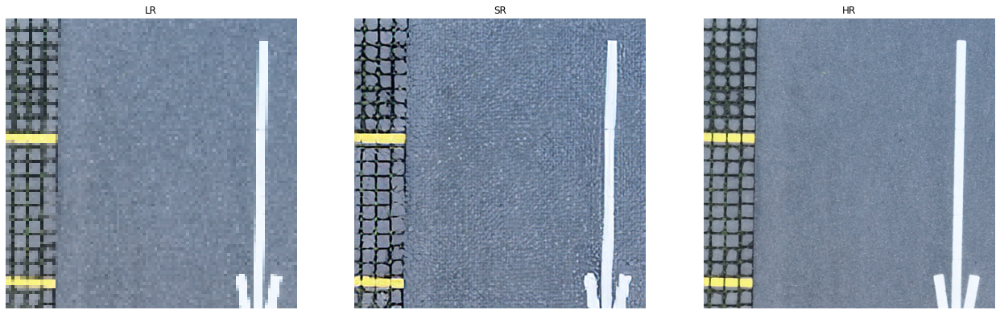

PSNR: 28.548104764107862
SSIM: 0.3348946561873369


<Figure size 1584x1080 with 0 Axes>

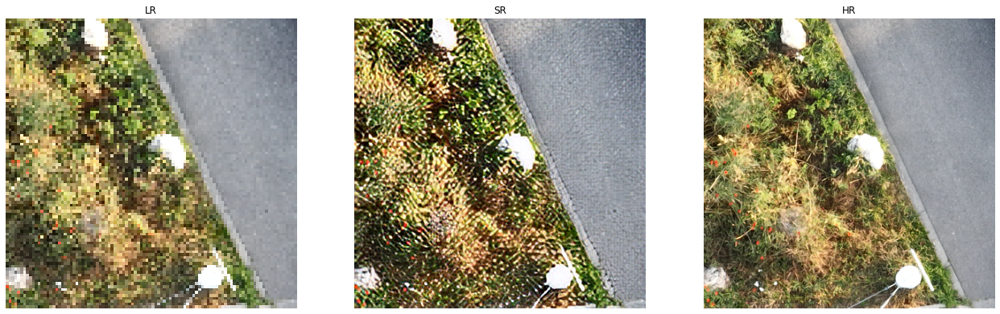

PSNR: 28.763530003947885
SSIM: 0.4663378337007342


<Figure size 1584x1080 with 0 Axes>

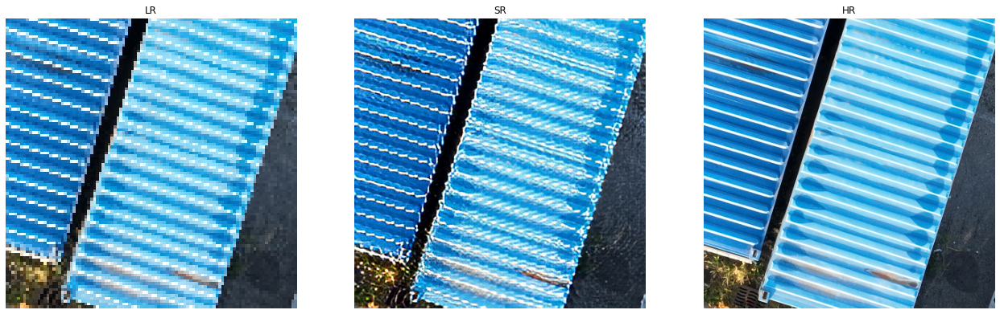

PSNR: 28.21974092747483
SSIM: 0.24797172760179


<Figure size 1584x1080 with 0 Axes>

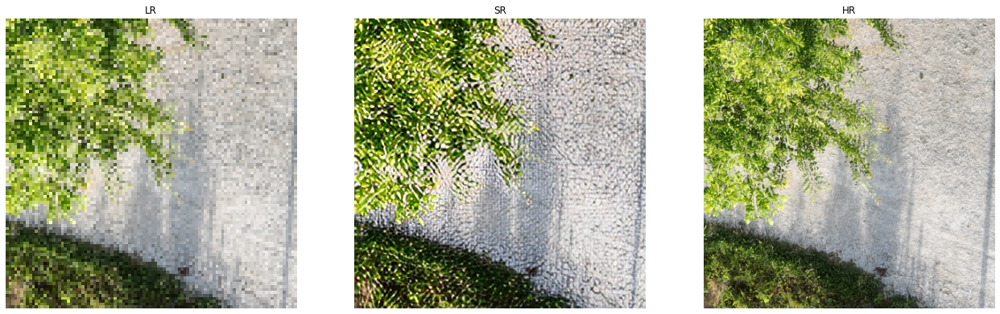

PSNR: 28.41572067108381
SSIM: 0.29470773197985595


<Figure size 1584x1080 with 0 Axes>

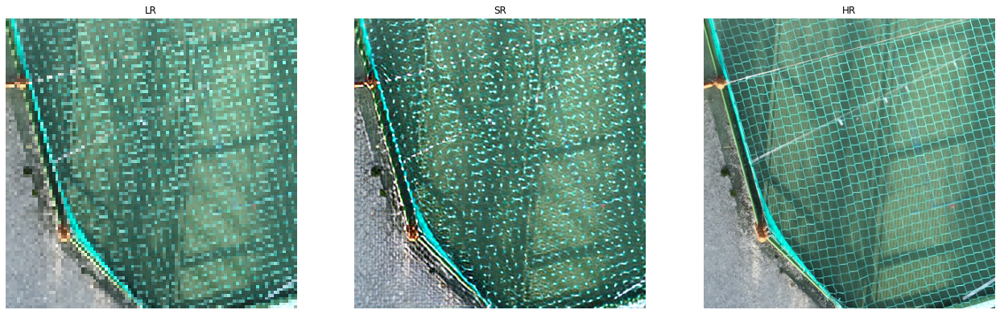

PSNR: 28.929514558602826
SSIM: 0.4724625702690255


<Figure size 1584x1080 with 0 Axes>

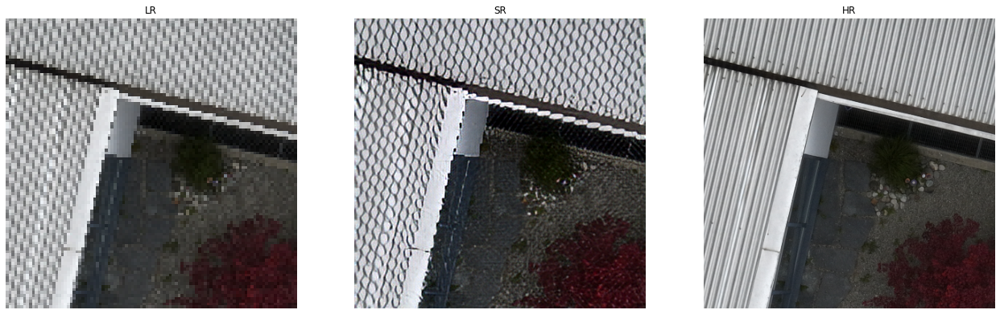

PSNR: 28.632754921569568
SSIM: 0.3521912443618258


<Figure size 1584x1080 with 0 Axes>

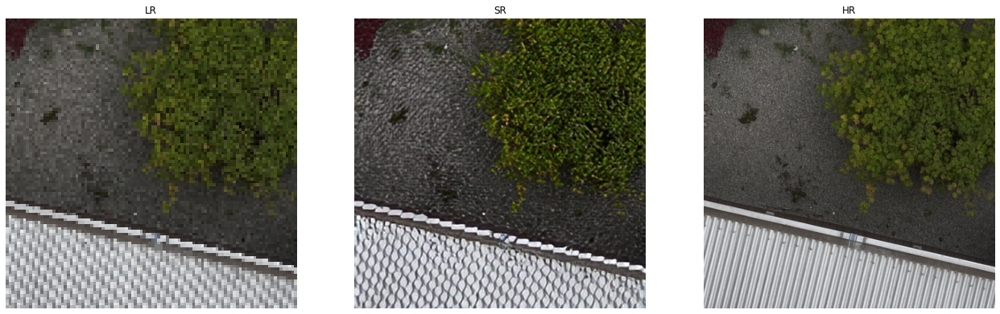

PSNR: 30.16691995457183
SSIM: 0.5979392466140586


<Figure size 1584x1080 with 0 Axes>

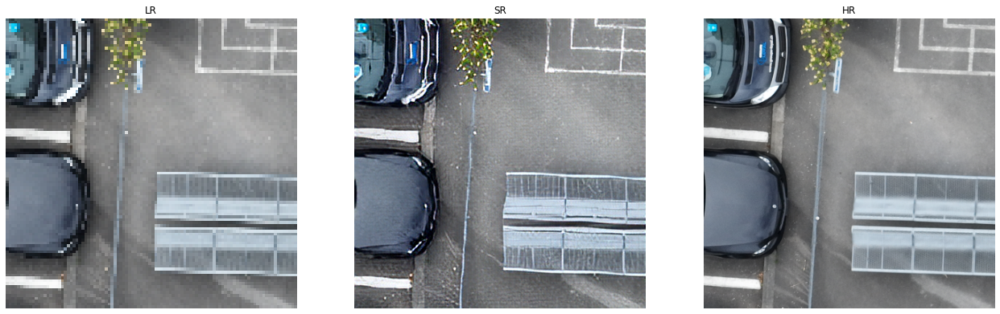

PSNR: 29.610044530966096
SSIM: 0.41102365811103275


<Figure size 1584x1080 with 0 Axes>

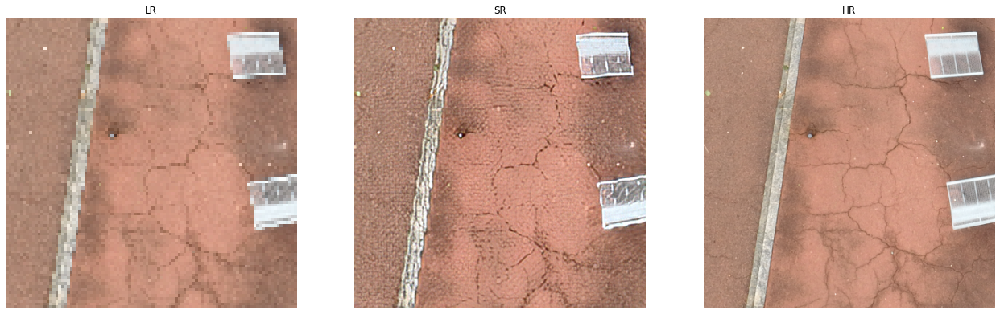

Average PSNR: 28.905089507855088
Average SSIM: 0.3682351909661396
Time Taken: 10.677396


In [ ]:
start = time.time()

PSNR = 0
SSIM = 0

ESRGAN_samples = []

paths = sorted(os.listdir("test_100_400/lr_100/"))
for i in range(len(os.listdir("test_100_400/lr_100/"))):
  IMAGE_PATH = "test_100_400/lr_100/"+paths[i]
  input_image = preprocess_image(IMAGE_PATH)
  fake_image = model(input_image)
  fake_image = tf.squeeze(fake_image)
  image = np.asarray(tf.squeeze(fake_image))
  image = tf.clip_by_value(image, 0, 255)
  image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
  hr_image = Image.open("test_100_400/hr_400/"+paths[i])
  PSNR += psnr(image, hr_image)
  SSIM += calculate_ssim(image, hr_image)
  if i < 9:
    print("PSNR:", psnr(image, hr_image))
    print("SSIM:", calculate_ssim(image, hr_image))
    plot_samples([Image.open("test_100_400/lr_100/"+paths[i]), image, hr_image])
    ESRGAN_samples.append(image)
    image.save("ESRGAN_sample"+str(i)+".png")
  
print("Average PSNR:", PSNR/len(paths))
print("Average SSIM:", SSIM/len(paths))
print("Time Taken: %f" % (time.time() - start))


## Real-ESRGAN inference

Whitepaper by Xintao Wang, Liangbin Xie, Chao Dong and Ying Shan:
Real-ESRGAN: Training Real-World Blind Super-Resolution with Pure Synthetic Data - https://arxiv.org/pdf/2107.10833.pdf

Real-ESRGAN aims at developing Practical Algorithms for General Image/Video Restoration. The authors extend the powerful ESRGAN to a practical restoration application (namely, Real-ESRGAN), which is pre-trained with pure synthetic data.

Code source: https://github.com/xinntao/Real-ESRGAN
The RealESRGAN_x4plus model was trained by the authors on open datasets with synthetic degradations. The model performs x4 upscaling out of the box, so let's run inferences on the test image segments.

The RealESRGAN_x4plus model was trained by the authors on open datasets with synthetic degradations. The model performs x4 upscaling out of the box, so let's run inferences on the test image segments.

In [ ]:
# Clone Real-ESRGAN and enter the Real-ESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd /content/Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

In [ ]:
import os
from google.colab import files
import shutil

result_folder = 'results'

if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)

In [ ]:
!python inference_realesrgan.py -n RealESRGAN_x4plus -i /content/test_100_400/lr_100 --outscale 4


Testing 0 0
Testing 1 101
Testing 2 110
Testing 3 120
Testing 4 122
Testing 5 123
Testing 6 126
Testing 7 132
Testing 8 134
Testing 9 137
Testing 10 140
Testing 11 142
Testing 12 155
Testing 13 160
Testing 14 161
Testing 15 165
Testing 16 166
Testing 17 169
Testing 18 17
Testing 19 172
Testing 20 184
Testing 21 187
Testing 22 189
Testing 23 19
Testing 24 190
Testing 25 197
Testing 26 21
Testing 27 28
Testing 28 31
Testing 29 32
Testing 30 36
Testing 31 37
Testing 32 41
Testing 33 46
Testing 34 47
Testing 35 7
Testing 36 76
Testing 37 77
Testing 38 78
Testing 39 8
Testing 40 88


PSNR: 30.751117260078686
SSIM: 0.5921729363183479


<Figure size 1584x1080 with 0 Axes>

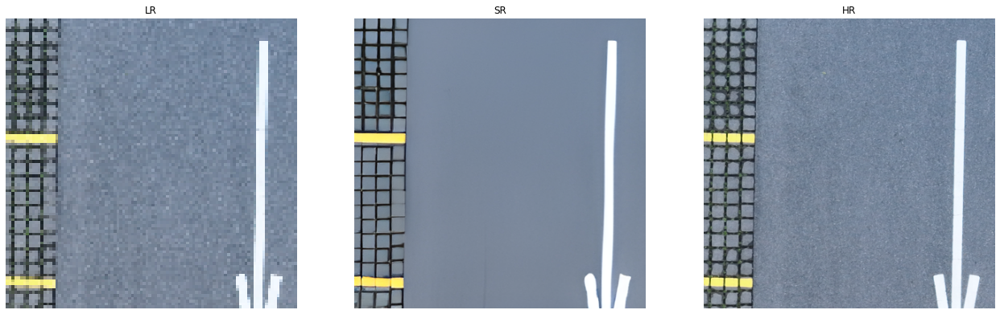

PSNR: 29.340838751333145
SSIM: 0.4422091331903095


<Figure size 1584x1080 with 0 Axes>

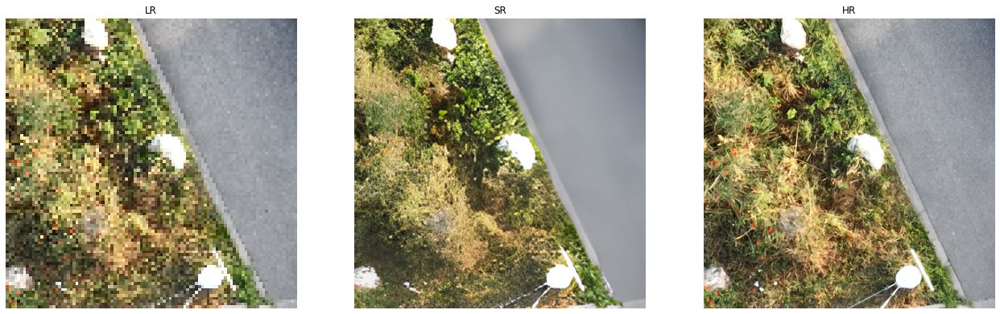

PSNR: 28.840638868317004
SSIM: 0.6187501883662192


<Figure size 1584x1080 with 0 Axes>

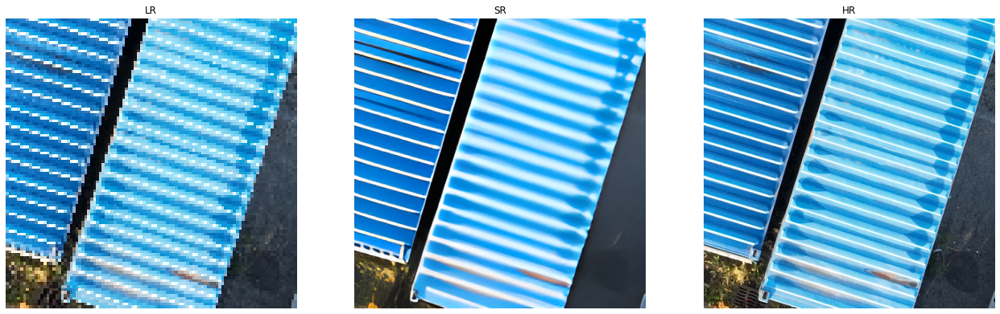

PSNR: 28.728606975113596
SSIM: 0.30135939190686173


<Figure size 1584x1080 with 0 Axes>

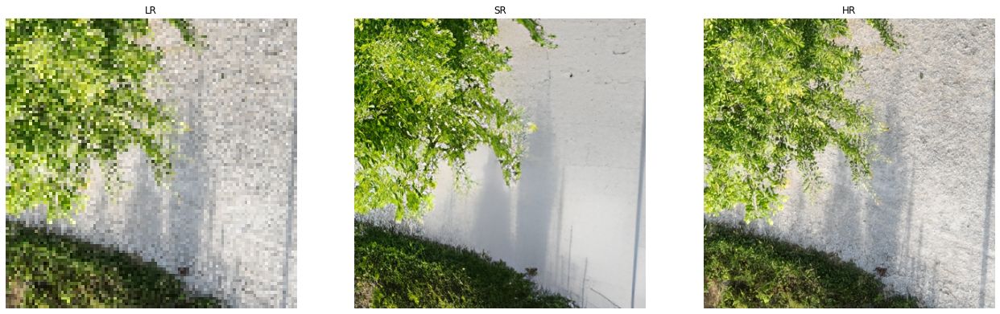

PSNR: 28.30469798217708
SSIM: 0.21859604338820207


<Figure size 1584x1080 with 0 Axes>

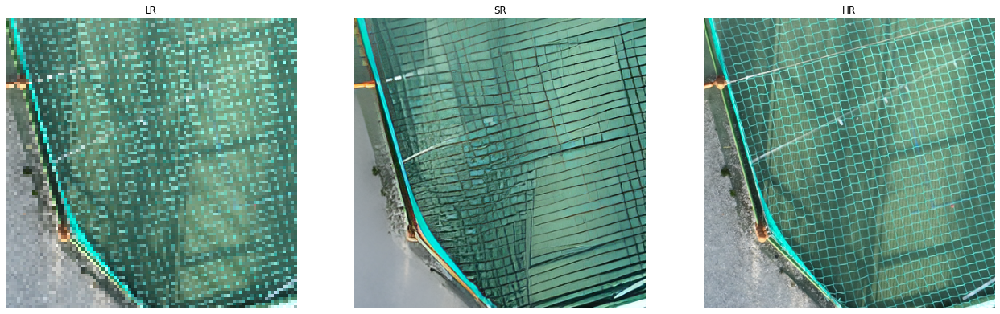

PSNR: 29.64710299874259
SSIM: 0.6761620513877352


<Figure size 1584x1080 with 0 Axes>

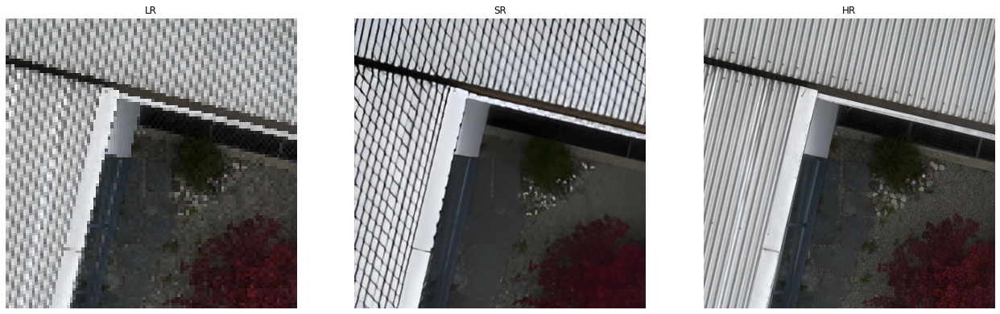

PSNR: 29.45157946780315
SSIM: 0.48646792777994907


<Figure size 1584x1080 with 0 Axes>

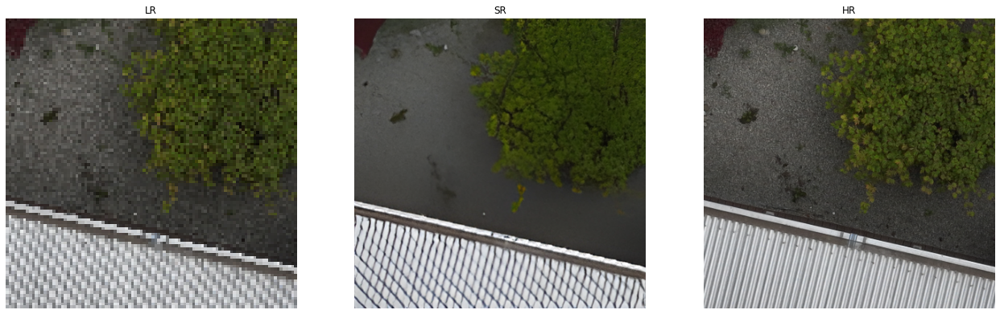

PSNR: 31.839063020995386
SSIM: 0.786957742181293


<Figure size 1584x1080 with 0 Axes>

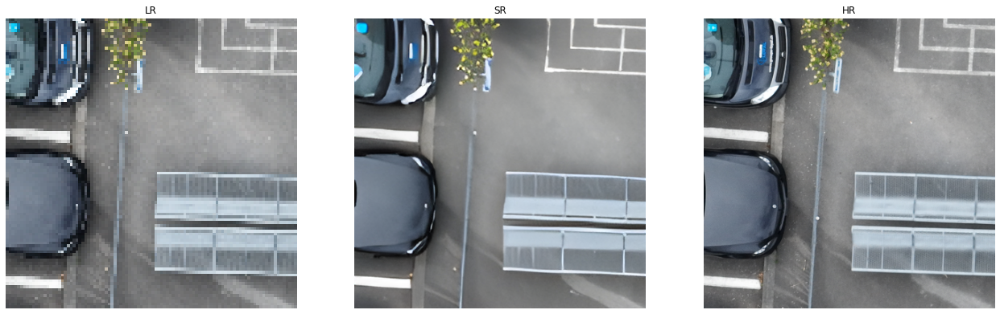

PSNR: 31.542434166002536
SSIM: 0.6468284317016977


<Figure size 1584x1080 with 0 Axes>

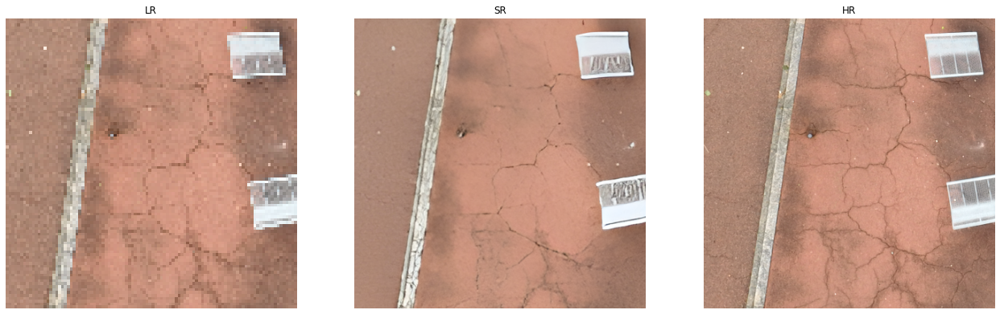

In [ ]:
PSNR = 0
SSIM = 0

RealESRGAN_samples = []

sr_paths = sorted(os.listdir("/content/Real-ESRGAN/results/"))
paths = sorted(os.listdir("/content/test_100_400/lr_100/"))
for i in range(len(paths)):
    lr_image = Image.open("/content/test_100_400/lr_100/"+paths[i])
    image = Image.open("/content/Real-ESRGAN/results/"+sr_paths[i])
    hr_image = Image.open("/content/test_100_400/hr_400/"+paths[i])
    PSNR += psnr(image, hr_image)
    SSIM += calculate_ssim(image, hr_image)
    if i < 9:
      print("PSNR:", psnr(image, hr_image))
      print("SSIM:", calculate_ssim(image, hr_image))
      plot_samples([lr_image, image, hr_image])
      RealESRGAN_samples.append(image)
      image.save("Real-ESRGAN_sample"+str(i)+".png")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Model finetuning

In [ ]:
!git clone https://github.com/victorca25/traiNNer

In [ ]:
%cd traiNNer/codes

/content/traiNNer/codes


In [ ]:
! wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
! unzip ngrok-stable-linux-amd64.zip

--2022-12-07 11:23:14--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 54.161.241.46, 52.202.168.65, 18.205.222.128, ...
Connecting to bin.equinox.io (bin.equinox.io)|54.161.241.46|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13832437 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.19M  19.1MB/s    in 0.7s    

2022-12-07 11:23:15 (19.1 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13832437/13832437]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


**Update train_sr.yml before training**

In [ ]:
!python train.py -opt /content/traiNNer/codes/options/sr/train_sr.yml

export CUDA_VISIBLE_DEVICES=0
22-12-07 11:29:38.840 - INFO:   name: 002_sr_template
  use_tb_logger: True
  model: sr
  scale: 4
  gpu_ids: [0]
  use_amp: True
  use_swa: False
  use_cem: False
  use_atg: False
  datasets:[
    train:[
      name: DIV2K
      mode: aligned
      dataroot_HR: /content/drive/MyDrive/data/DSR_train/DSR_highres
      dataroot_LR: /content/drive/MyDrive/data/DSR_train/DSR_lowres
      subset_file: None
      use_shuffle: True
      znorm: False
      n_workers: 4
      batch_size: 8
      virtual_batch_size: 8
      preprocess: crop
      crop_size: 400
      image_channels: 3
      use_flip: True
      use_rot: True
      use_hrrot: False
      phase: train
      scale: 4
      data_type: img
      aug_configs:[
        lr_downscale_types:[
          resize:[
            resize_prob:[
              down: 1.0
            ]
            resize_range_up: [1, 1.5]
            resize_range_down: [0.15, 1]
            down_up_min: 0.5
          ]
        ]
      